In [1]:
from __future__ import division
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import wrangle
from sklearn.model_selection import train_test_split
# ignore warnings
import warnings
warnings.filterwarnings("ignore")
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import auc, roc_curve, roc_auc_score, precision_recall_curve
sns.set()
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sns
import missingno as msno

from pandas.plotting import scatter_matrix

import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots


from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, MinMaxScaler
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)
from sklearn.preprocessing import MinMaxScaler
import itertools
from sklearn import metrics
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.ensemble import AdaBoostClassifier

In [33]:
df = pd.read_csv('data/training_v2.csv')
id_col = 'encounter_id'

df1 = pd.read_csv('data/full_data_dictionary.csv')
df_obj = df1[(df1['Data Type'] == 'string') | (df1['Data Type'] == 'binary')]
cat_features = list(df_obj['Variable Name'].values)
for c in cat_features:
    if c not in df1.columns or c == 'hospital_death':
        cat_features.remove(c)
print(f'cat_features: {cat_features}')

cat_features: ['bmi', 'ethnicity', 'hospital_admit_source', 'icu_admit_type', 'icu_type', 'apache_2_diagnosis', 'apache_post_operative', 'gcs_unable_apache', 'ventilated_apache', 'cirrhosis', 'hepatic_failure', 'leukemia', 'solid_tumor_with_metastasis', 'apache_2_bodysystem']


In [34]:
df3 = pd.read_csv('data/training_v2.csv')
df['gcs'] = df.gcs_eyes_apache + df.gcs_motor_apache + df.gcs_verbal_apache

In [35]:
train, test = train_test_split(df, train_size = .80, random_state = 42, stratify = df.hospital_death)

In [36]:
dfa = df[['hospital_death', 'bmi', 'age', 'gender','gcs', 'ventilated_apache', 'fio2_apache', 'heart_rate_apache', 'hematocrit_apache', 'intubated_apache','map_apache','temp_apache', 'paco2_apache','pao2_apache', 'ph_apache', 'resprate_apache','sodium_apache']]
dfa = dfa.dropna()

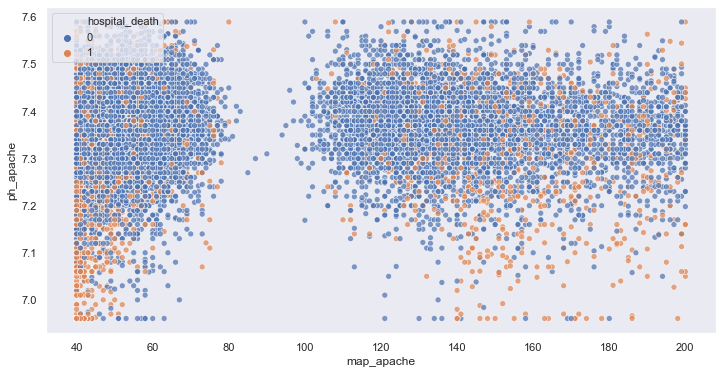

In [37]:
plt.figure(figsize = (12,6))
sns.scatterplot(x = 'map_apache', y = 'ph_apache', data = dfa, hue = 'hospital_death', alpha = 0.7)
plt.grid()
plt.legend(loc='upper left')

In [38]:
dfa = dfa.astype({'hospital_death': 'object'})

In [51]:
fig = px.scatter(
    dfa,
    x="map_apache",
    y="ph_apache",
    #size="count",
    color="gender",
    hover_name="gender",
    log_x=False,
    #size_max=10,
)


#fig.update_layout(showlegend=True)
fig.update_layout(legend_title_text='Gender')
fig.update_layout(title_text="<b>Blood PH vs Arterial Pressure by Gender<b>")
fig.update_yaxes(title_text="<b>Blood pH level<b>")
fig.update_xaxes(title_text="<b>Mean Arterial Pressure<b>")
fig.show()

## Uncomment this code to create the HTML file to embed chart
pio.write_html(fig, file='index_1.html', auto_open=True)

In [48]:
fig = px.scatter(
    dfa,
    x="map_apache",
    y="ph_apache",
    #size="count",
    color="hospital_death",
    hover_name="hospital_death",
    log_x=False,
    #size_max=10,
)


#fig.update_layout(showlegend=True)
fig.update_layout(legend_title_text='Gender')
fig.update_layout(title_text="<b>Blood PH vs Arterial Pressure by Gender<b>")
fig.update_yaxes(title_text="<b>Blood pH level<b>")
fig.update_xaxes(title_text="<b>Mean Arterial Pressure<b>")
fig.show()

## Uncomment this code to create the HTML file to embed chart
#pio.write_html(fig, file='index_1.html', auto_open=True)

In [39]:
df = df.astype({'hospital_death': 'object'})

In [40]:
#df = df.hop
df.loc[df['hospital_death'] == 0, 'hospital_death'] = 'Survived'

In [41]:
df.loc[df['hospital_death'] == 1, 'hospital_death'] = 'Deceased'

In [49]:
fig = px.scatter(
    dfa,
    x="map_apache",
    y="ph_apache",
    #size="count",
    color="hospital_death",
    hover_name="hospital_death",
    log_x=False,
    #size_max=10,
)


#fig.update_layout(showlegend=True)
fig.update_layout(legend_title_text='Patient Outcome')
fig.update_layout(title_text="<b>Blood PH vs Arterial Pressure by Patient Outcome<b>")
fig.update_yaxes(title_text="<b>Blood pH level<b>")
fig.update_xaxes(title_text="<b>Mean Arterial Pressure<b>")
fig.show()

## Uncomment this code to create the HTML file to embed chart
#pio.write_html(fig, file='index_1.html', auto_open=True)

In [50]:
fig = px.scatter(
    df,
    x="ph_apache",
    y="d1_lactate_max",
    #size="count",
    color="hospital_death",
    hover_name="hospital_death",
    log_x=False,
    #size_max=10,
)


#fig.update_layout(showlegend=True)
fig.update_layout(legend_title_text='Patient Outcome')
fig.update_layout(title_text="<b>Blood pH level vs Lactate levels<b>")
fig.update_yaxes(title_text="<b>Minimum Lactate Levels<b>")
fig.update_xaxes(title_text="<b>Blood pH level<b>")

# fig.update_layout(
#     title={
#         'text': "<b>Blood pH level vs Lactate levels<b>",
#         'y':0.94,
#         'x':0.5,
#         'xanchor': 'center',
#         'yanchor': 'top'})
fig.show()

# Uncomment this code to create the HTML file to embed chart
#pio.write_html(fig, file='index_1.html', auto_open=True)

In [12]:
fig = px.scatter(
    df,
    x="elective_surgery",
    y="d1_lactate_min",
    #size="count",
    color="hospital_death",
    hover_name="hospital_death",
    log_x=False,
    #size_max=10,
)

#fig.update_layout(showlegend=True)
# fig.update_layout(title_text="<b>Survival rate at different types of ICU<b>")
# fig.update_yaxes(title_text="<b>Average Hospital Death<b>")
# fig.update_xaxes(title_text="<b>Age<b>")
fig.show()

In [ ]:
dfa.shape

In [ ]:
animals=['giraffes', 'orangutans', 'monkeys']

fig = go.Figure(data=[
    go.Bar(name=df[df., x=animals, y=[20, 14, 23]),
    go.Bar(name='LA Zoo', x=animals, y=[12, 18, 29])
])
# Change the bar mode
fig.update_layout(barmode='stack')
fig.show()

In [ ]:
apache3=df[['age','apache_3j_bodysystem','hospital_death']]
apache3=apache3.groupby(['apache_3j_bodysystem','age']).agg(['size','mean']).reset_index()

apache3['size']=apache3['hospital_death']['size']
apache3['mean']=apache3['hospital_death']['mean']

apache3.drop('hospital_death',axis=1,inplace=True)

systems = apache3['apache_3j_bodysystem'].unique().tolist()
data = []
list_updatemenus = []
for n, s in enumerate(systems):
    visible = [False] * len(systems)
    visible[n] = True
    temp_dict = dict(label = str(s),
                 method = 'update',
                 args = [{'visible': visible},
                         {'title': '<b>'+s+'<b>'}])
    list_updatemenus.append(temp_dict)
    

for s in systems:
    mask = (apache3['apache_3j_bodysystem'].values == s) 
    trace = (dict(visible = False,     
        x = apache3.loc[mask, 'age'],
        y = apache3.loc[mask, 'mean'],
        mode = 'markers',
        marker = {'size':apache3.loc[mask, 'size']/apache3.loc[mask,'size'].sum()*1000,
                 'color':apache3.loc[mask, 'mean'],
                 'showscale': True})
                   )
    data.append(trace)

data[0]['visible'] = True

layout = dict(
    updatemenus=[dict(buttons=list_updatemenus)],
    xaxis=dict(
        title="<b>Age<b>",
        range=[min(apache3.loc[:, "age"]) - 10, max(apache3.loc[:, "age"]) + 10],
    ),
    yaxis=dict(
        title="<b>Average Hospital Death<b>",
        range=[min(apache3.loc[:, "mean"]) - 0.1, max(apache3.loc[:, "mean"]) + 0.1],
    ),
    title="<b>Survival Rate<b>",
)

fig = dict(data=data, layout=layout)
py.iplot(fig, filename='update_dropdown')

# Uncomment this code to create the HTML file to embed chart
#pio.write_html(fig, file='index.html', auto_open=True)

In [ ]:
def bar_race_plot (df, title, list_of_frames):
    """Creation of the bar chart race figure.
    Parameters:
    df (DataFrame): Pandas data frame containing the categorical variable ['Name'],
    the count ['Number'], the year ['Year'], and the color ['Color'] (separated columns).
    title (string): Title of the initial bar plot.
    list_of_frames (list): List of frames. Each frame contains a bar plot of a year.
    Returns:
    fig (figure instance): Bar chart race
    """
    
    # initial year - names (categorical variable), number of babies (numerical variable), and color
    initial_year = df['Year'].min()
    initial_names = df[df['Year'] == initial_year].Name
    initial_numbers = df[df['Year'] == initial_year].Number
    initial_color = df[df['Year'] == initial_year].Color
    range_max = df['Number'].max()
    
    fig = go.Figure(
        data=[go.Bar(x=initial_names, y=initial_numbers,
                       marker_color=initial_color, hoverinfo='none',
                       textposition='outside', texttemplate='%{x}<br>%{y}',
                       cliponaxis=False)],
        layout=go.Layout(font={'size': 14}, plot_bgcolor = '#FFFFFF',
                         xaxis={'showline': False, 'visible': False},
                         yaxis={'showline': False, 'visible': False, 'range': (0, range_max)},
                         bargap=0.15, title=title + str(initial_year),
                         updatemenus=[dict(type="buttons",
                                           buttons=[dict(label="Play",
                                                         method="animate",
                                                         args=[None,{"frame": {"duration": 2000, "redraw": True}, "fromcurrent": True}]),
                                                    dict(label="Stop",
                                                         method="animate",
                                                         args=[[None],{"frame": {"duration": 0, "redraw": False}, "mode": "immediate","transition": {"duration": 0}}])])]),
        frames=list(list_of_frames))
    
    return fig

In [ ]:
df.head()

In [ ]:
initial_names = df['ventilated_apache'].Name
initial_numbers = df[df["Year"] == initial_year].Number
initial_color = df[df["Year"] == initial_year].Color
range_max = df["Number"].max()

ICU_df["count"] = (
    ICU_day.groupby(["ventilated_apache"])
    .sum()
    .reset_index()["hospital_death"]
)

fig = go.Figure(
    data=[
        go.Bar(
            x=initial_names,
            y=initial_numbers,
            marker_color=initial_color,
            hoverinfo="none",
            textposition="outside",
            texttemplate="%{x}<br>%{y}",
            cliponaxis=False,
        )
    ],

In [ ]:
df.groupby(["ventilated_apache"])['hospital_death'].sum()

In [ ]:
df = pd.read_csv('data/training_v2.csv')
df.head()

In [ ]:
top20 = (
    df[['ventilated_apache',
        'apache_4a_icu_death_prob',
        'elective_surgery_2',
        'elective_surgery_1',
        'd1_lactate_min',
        'd1_sysbp_min',
        'apache_3j_bodysystem_Metabolic',
        'd1_spo2_min',
        'solid_tumor_with_metastasis_1',
        'd1_heartrate_min',
        'd1_bun_min',
        'd1_bun_max',
        'immunosuppression_1',
        'd1_temp_min',
        'age',
        'ventilated_apache_2',
        'apache_3j_bodysystem_Neurological',
        'hospital_death']]
)

In [ ]:
# Normalized Pclass survival by gender
Pclass1_male = train["Survived"][(train["Pclass"] == 1) & 
               (train["Sex"] == "male")].value_counts(normalize = True)
Pclass2_male = train["Survived"][(train["Pclass"] == 2) & 
               (train["Sex"] == "male")].value_counts(normalize = True)
Pclass3_male = train["Survived"][(train["Pclass"] == 3) & 
               (train["Sex"] == "male")].value_counts(normalize = True)

Pclass1_female = train["Survived"][(train["Pclass"] == 1) & 
                    (train["Sex"] == "female")].value_counts(normalize = True)
Pclass2_female = train["Survived"][(train["Pclass"] == 2) &
                    (train["Sex"] == "female")].value_counts(normalize = True)
Pclass3_female = train["Survived"][(train["Pclass"] == 3) & 
                    (train["Sex"] == "female")].value_counts(normalize = True)

# Survival by Class and Gender- Grouped Barplot
trace0 = go.Bar(
    x=['Pclass 1', 'Pclass 2', 'Pclass 3'],
    y=[Pclass1_male[1], Pclass2_male[1], Pclass3_male[1]],
    name='male'
)
trace1 = go.Bar(
    x=['Pclass 1', 'Pclass 2', 'Pclass 3'],
    y=[Pclass1_female[1], Pclass2_female[1], Pclass3_female[1]],
    name='female'
)

data = [trace0, trace1]
layout = go.Layout(autosize = False, width = 500, height = 400,
    barmode='group',yaxis = dict(title = 'Survival Rates'),
                   title = 'Survival by Class and Gender')

fig6 = go.Figure(data=data, layout=layout)
py.iplot(fig6)